# Motivation

When digitalising documents it is very often case when scanned document pages have some distortions and noise that worsen quality of page and overall document. 

# Introduction

To solve problem described above, we will use convolutional neural network for image denoising. An autoencoder is a type of neural network that learns to compress and reconstruct input data. It consists of an encoder that compresses the data into a lower-dimensional representation, and a decoder that reconstructs the original data from the compressed representation [U-Net](https://en.wikipedia.org/wiki/U-Net) is used as baseline architecture.

# Description

Firstly we will prepare synthetic data. Then noise will be applied to images. After that we will build convolutional autoencoder and train it using our synthetic data prepared earlier.

### Prepare data

In [2]:
# Convert pdf document into images
from pdf2image import convert_from_path
import os
import shutil
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
from augraphy import *

pages = convert_from_path("59248-pdf.pdf", dpi=80)

if os.path.isdir('images'):
    shutil.rmtree('images/', ignore_errors=True)

os.makedirs("images/")

for i, image in enumerate(pages):
      cv2.imwrite("images/page_"+str(i)+".png", np.asarray(image))

file_paths = glob.glob("images/*.png")

# prepare synthetic noise function using albumentation packet
# def noise(image):
#     dirtydrum1 = [DirtyDrum(line_width_range=(1, 4),
#                         line_concentration=0.1,
#                         direction=0,
#                         noise_intensity=0.5,
#                         noise_value=(0, 30),
#                         ksize=(3, 3),
#                         sigmaX=0,
#                         )]
    
#     badphotocopy = [BadPhotoCopy(noise_type=1,
#                                    noise_side="left",
#                                    noise_iteration=(2,3),
#                                    noise_size=(2,3),
#                                    noise_sparsity=(0.15,0.15),
#                                    noise_concentration=(0.3,0.3),
#                                    blur_noise=-1,
#                                    blur_noise_kernel=(5, 5),
#                                    wave_pattern=0,
#                                    edge_effect=0)]
    
#     post = [BindingsAndFasteners(overlay_types="darken",
#                                           foreground=None,
#                                           effect_type="punch_holes",
#                                           width_range = (70,80),
#                                           height_range = (70,80),
#                                           ntimes=(3, 3),
#                                           nscales=(1.5, 1.5),
#                                           edge="left",
#                                           edge_offset=(30,50),
#                                           use_figshare_library=0,
#                                           )]

#     pipeline = AugraphyPipeline(dirtydrum1, post, badphotocopy)
#     complete = pipeline.augment(image)
#     print(image.shape)
#     print(complete['output'].shape)
#     return complete['output']

def noise(array):
    noise_factor = 0.4
    noisy_array = array + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=array.shape
    )

    return np.clip(noisy_array, 0.0, 1.0)

original_images = []

for i, file_path in enumerate(file_paths):
    image = cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    original_images.append(image)

original_images = np.asarray(original_images)
print(original_images.shape)


(448, 552, 416)


313
135
(135, 552, 416)
(313, 552, 416)
(135, 552, 416, 3)
(313, 552, 416, 3)
(135, 552, 416, 3)
(135, 552, 416, 3)


<Figure size 2000x400 with 0 Axes>

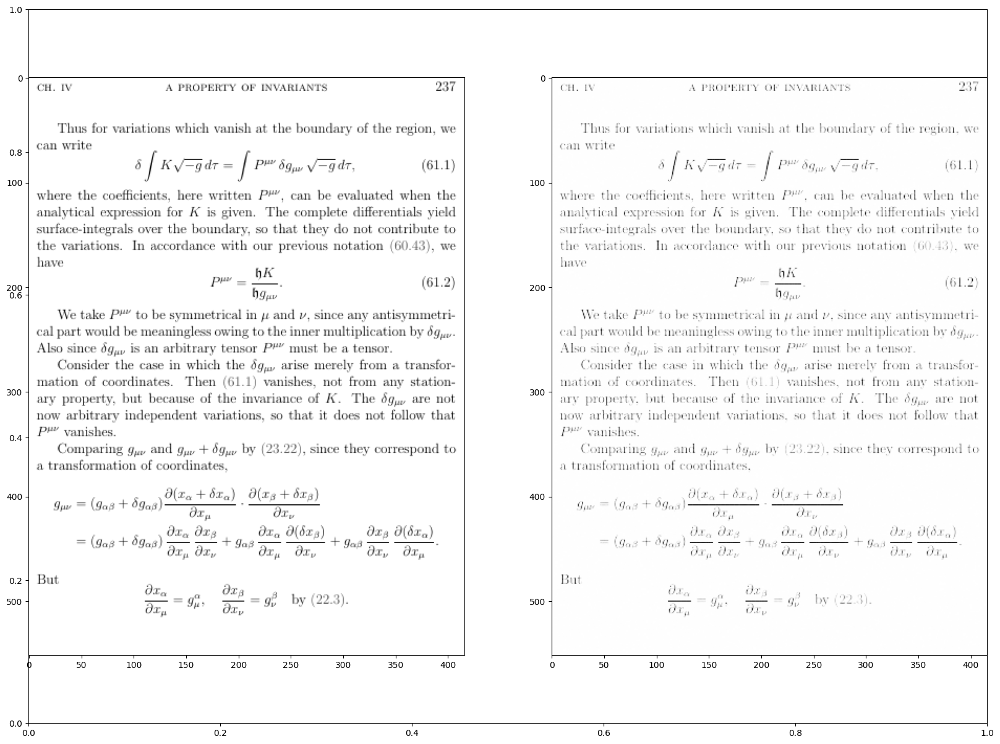

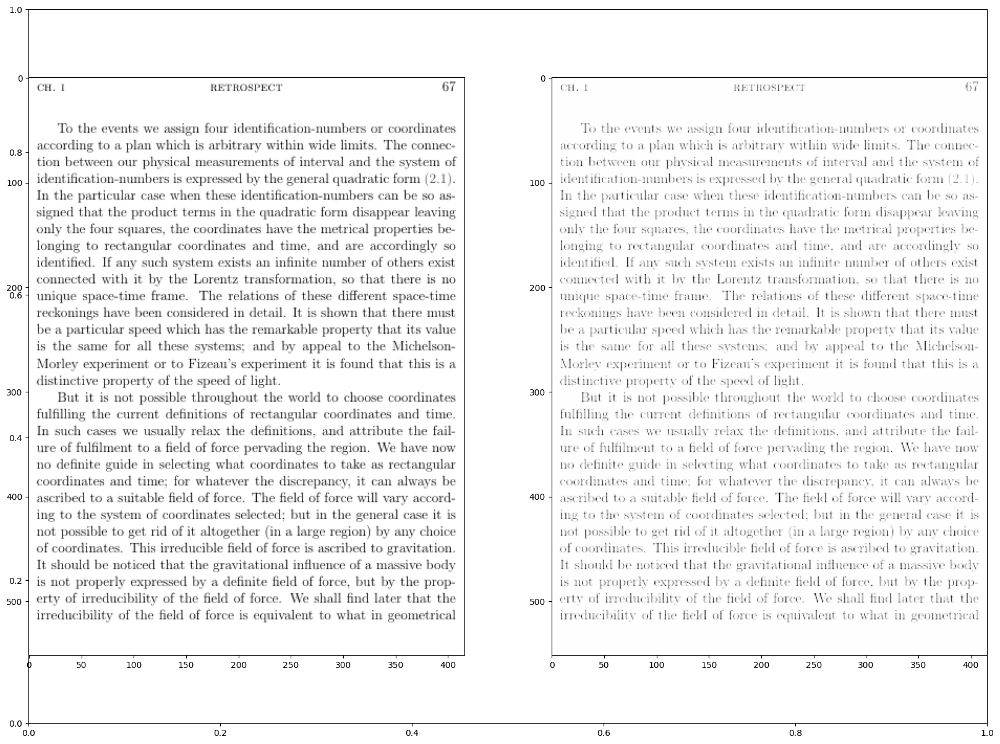

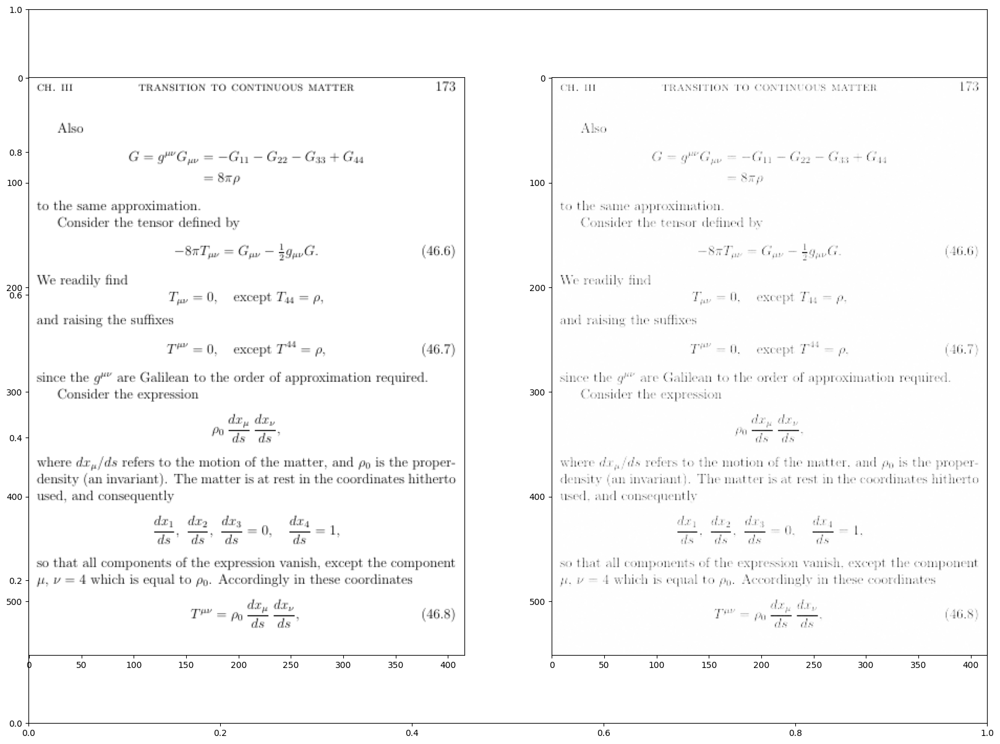

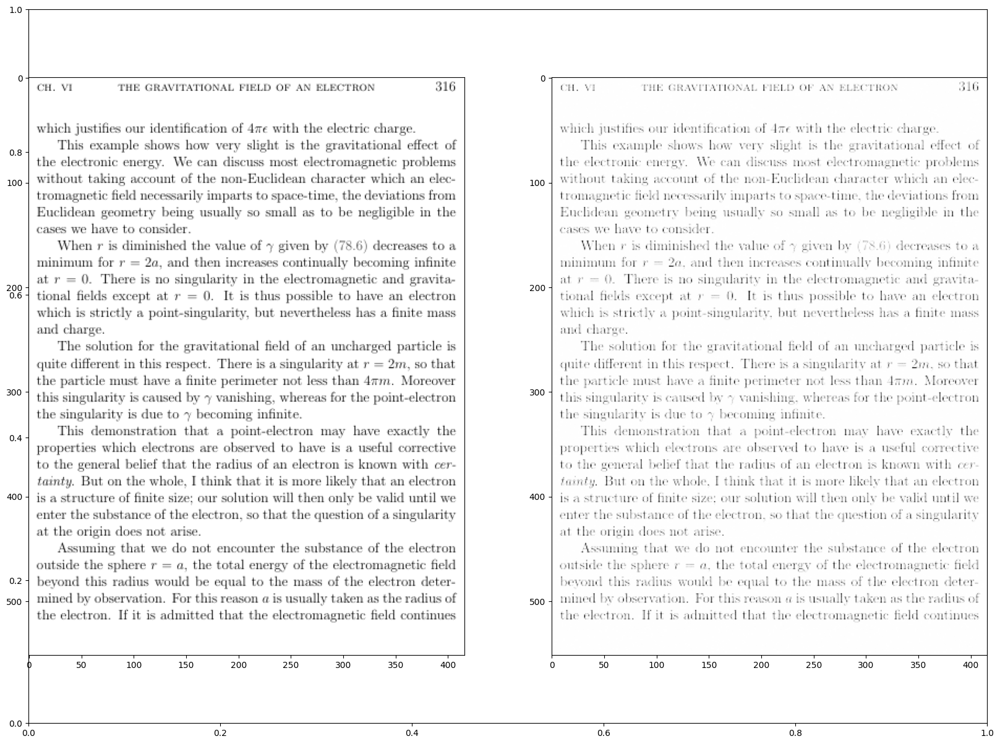

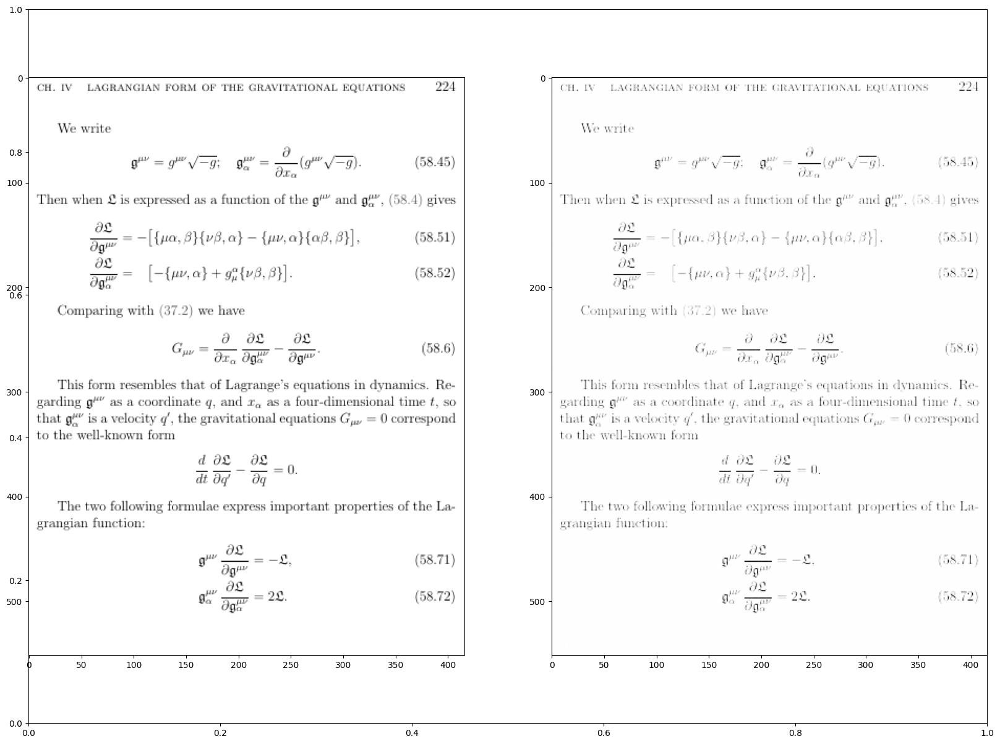

In [3]:
from sklearn.model_selection import train_test_split

def display(array1, array2):
    """Displays ten random images from each array."""
    n = 5
    indices = np.random.randint(len(array1), size=n)
    images1 = array1[indices, :]
    images2 = array2[indices, :]

    plt.figure(figsize=(20, 4))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        fig, axes = plt.subplots(figsize=(20,15))
        plt.subplot(121)
        plt.imshow(image1, cmap='gray')
        plt.subplot(122)
        plt.imshow(image2, cmap='gray')

    plt.show()

# split dataset into train and validation, 70% (train) / 30% (test)
train, test = train_test_split(original_images, train_size=0.7,random_state=1)

print(len(train))
print(len(test))

train = train / 255.0
test = test / 255.0

print(test.shape)
print(train.shape)

# noisy_train_data = np.asarray([noise(image) for image in train])
# noisy_test_data = np.asarray([noise(image) for image in test])

noisy_train_data = noise(train)
noisy_test_data = noise(test)


print(noisy_test_data.shape)
print(noisy_train_data.shape)

display(train, noisy_train_data)


### Build the autoencoder

In [41]:
from keras import layers
from keras.models import Model
import tensorflow as tf

input = layers.Input(shape=(552, 416, 1))

# Encoder
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(input)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(1, (3, 3), activation="sigmoid", padding="same")(x)

# Autoencoder
autoencoder = Model(input, x)
autoencoder.compile(optimizer="adam", loss="binary_crossentropy")
autoencoder.summary()



Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 552, 416, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 552, 416, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_32 (MaxPooling2D) │ (None, 276, 208, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 276, 208, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_33 (MaxPooling2D) │ (None, 138, 104, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_27             │ (None, 276, 208, 32)   │         9,248 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_28             │ (None, 552, 416, 32)   │         9,248 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 552, 416, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 28,353 (110.75 KB)

 Trainable params: 28,353 (110.75 KB)

 Non-trainable params: 0 (0.00 B)

### Training

In [42]:

autoencoder.fit(
    x=train,
    y=train,
    epochs=25,
    batch_size=128,
    shuffle=True,
    validation_data=(test, test),
)

Epoch 1/25


4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 551ms/stepWARNING:tensorflow:5 out of the last 16 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x34f570ea0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 461ms/step


<Figure size 2000x400 with 0 Axes>

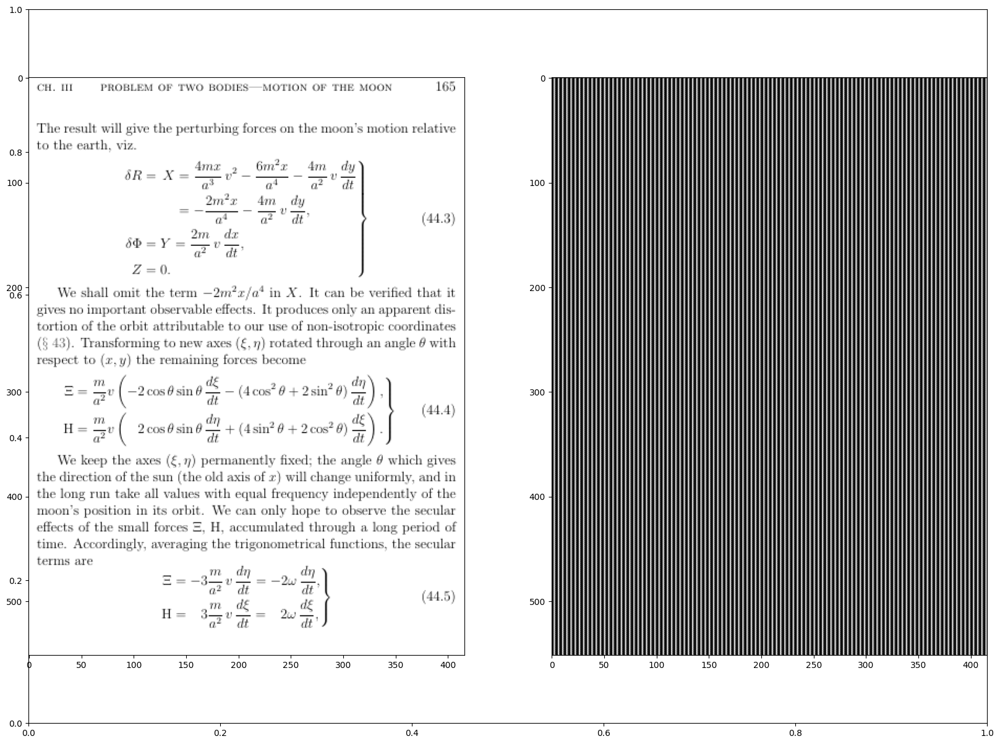

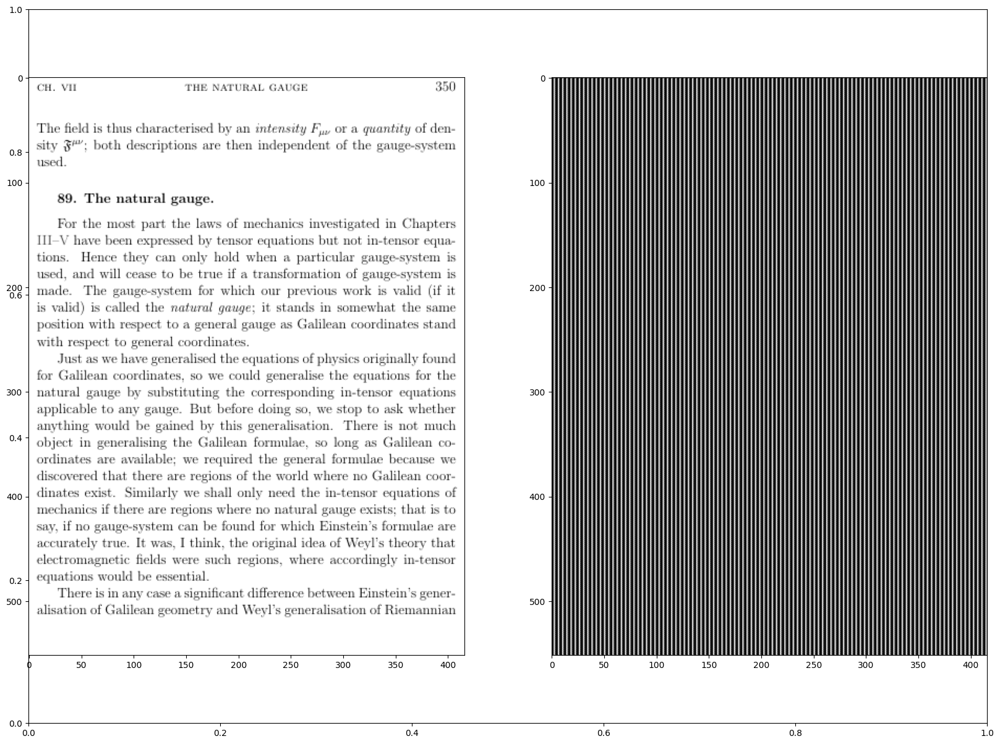

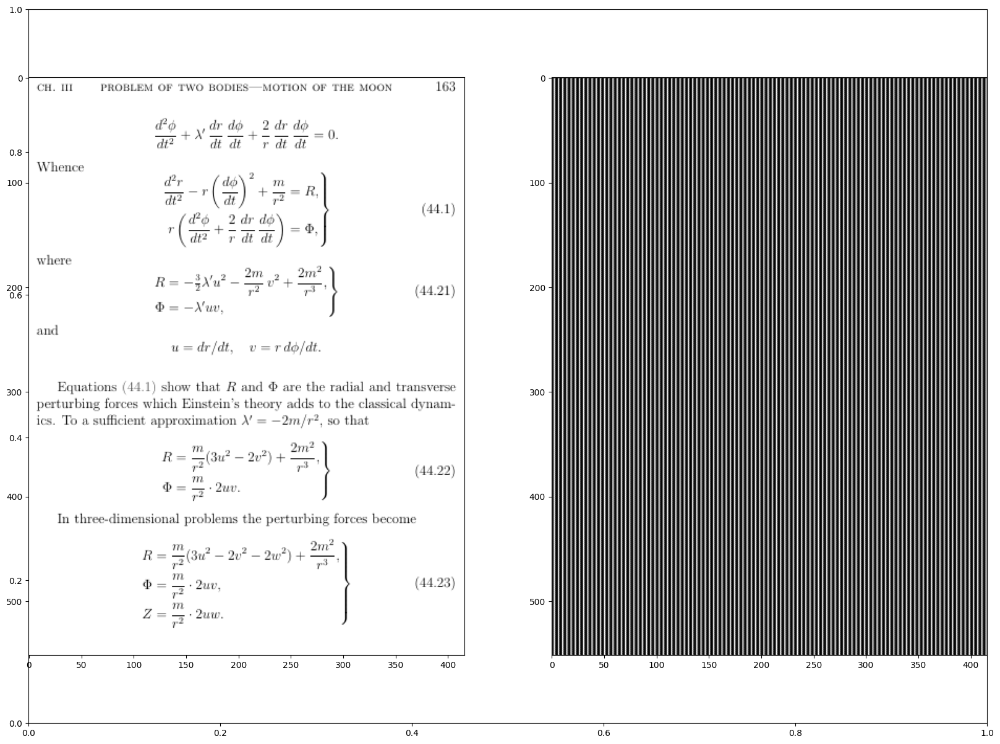

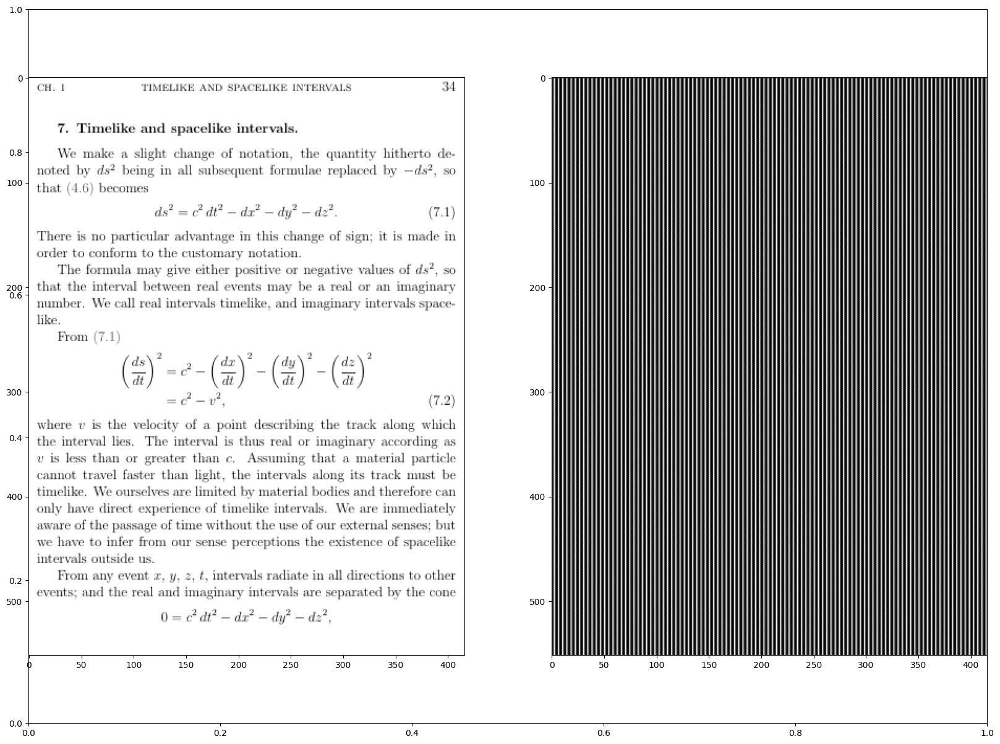

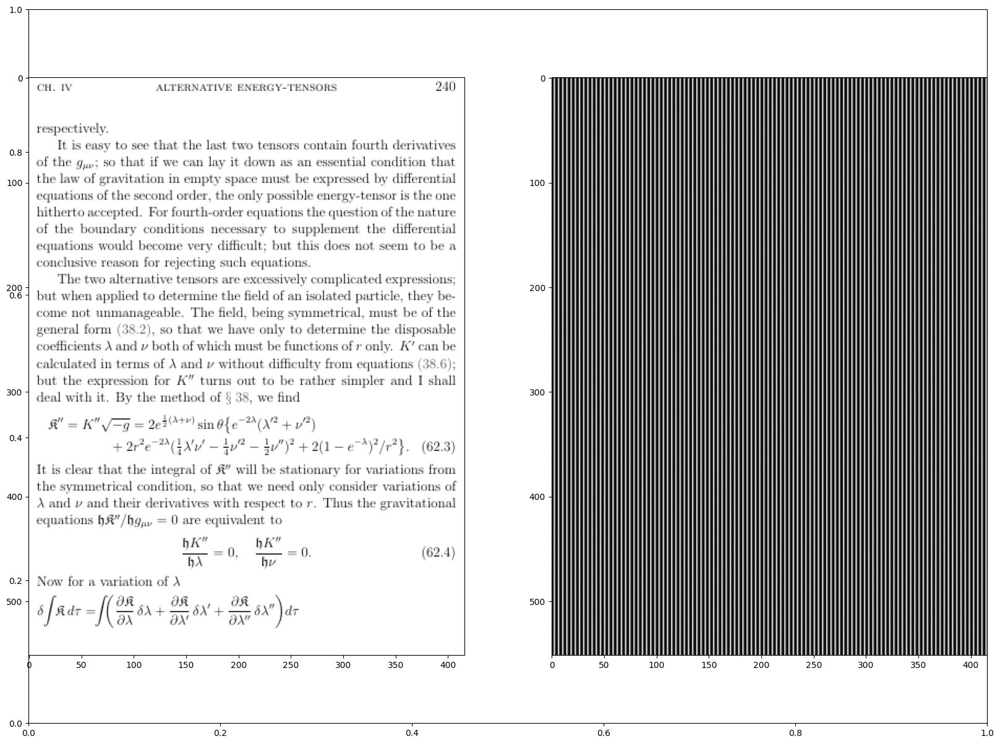

In [37]:
predictions = autoencoder.predict(test)

display(test, predictions)

In [40]:
print(noisy_train_data.shape)
print(noisy_test_data.shape)
autoencoder.fit(
    x=noisy_train_data,
    y=train,
    epochs=25,
    batch_size=128,
    shuffle=True,
    validation_data=(noisy_test_data, test),
)

predictions = autoencoder.predict(noisy_test_data)
display(noisy_test_data, predictions)

(313, 552, 416, 3)
(135, 552, 416, 3)
Epoch 1/25


ValueError: as_list() is not defined on an unknown TensorShape.